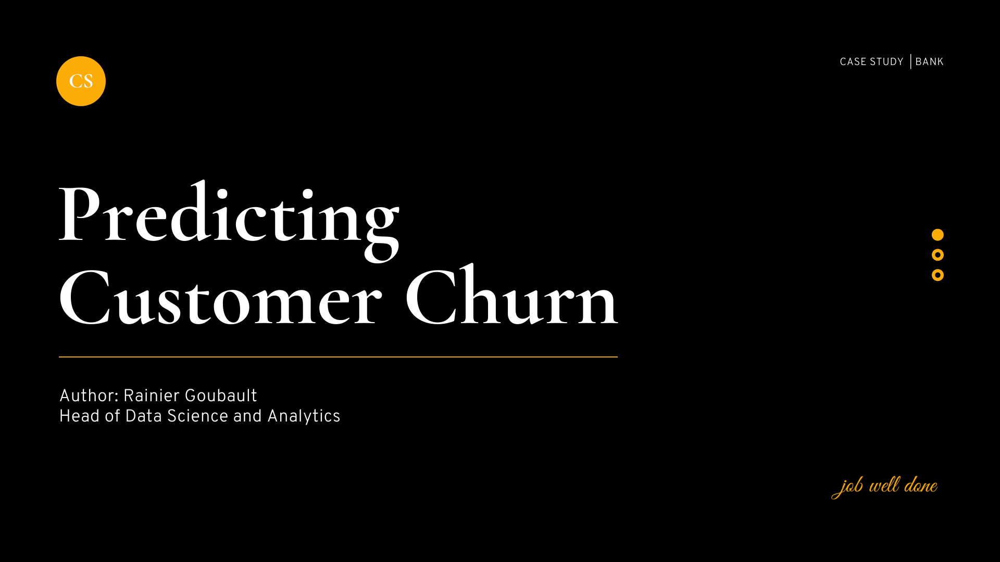

###### LinkedIn: https://www.linkedin.com/in/rainiergoubault/

# Objective

    1. Identify and visualize which factors contribute to customer churn.

    2. Build a re-usable machine learning pipeline prediction model that will classify if a customer 
       is going to churn or not, thus making it easier for the company to target these 'high-risk' customers 
       (i.e. those that might churn) as apart of its customer retention strategy/efforts.

# Introduction

## What is churn?
Churn is defined as when customers discontinue doing business with a company.

## Why is churn important?
Most companies have a large number of customers and can't afford to devote much time and resources for individual customer retention. However, if a company could forecast which customers are most likely to leave ahead of time, it could focus its customer rentention efforts on these 'high-risk' churn customers.

As a result, by addressing customer churn, these companies may not only preserve their market position, but also grow and thrive. A company key focus for success is reducing client attrition and implementing an effective retention strategy.

### Dataset:
The dataset used can be found at: https://www.kaggle.com/santoshd3/bank-customers

Let's begin....

# 1. Gather The Data

## 1.1 Import Libraries

In [1]:
# Warning
import warnings
warnings.filterwarnings('ignore')

# Data Manipulation
import numpy as np 
import pandas as pd

# Statistics
from scipy import stats
from scipy.stats import norm, skew
from scipy.stats import mannwhitneyu

# Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

import cufflinks as cf

import plotly
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

from plotly.offline import iplot
from plotly.subplots import make_subplots

# Preprocessing 
from sklearn.compose import make_column_selector as selector
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PolynomialFeatures, OrdinalEncoder

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier

# Model Evaluation
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, RandomizedSearchCV, cross_val_score

# Metrics
from sklearn.metrics import roc_auc_score, confusion_matrix, classification_report, precision_score, recall_score


# Set visualiation options
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

sns.set_style('white')

import plotly.io as pio
pio.renderers.default = 'notebook_connected'

cf.go_offline()

# Set notebook options
pd.set_option('display.max_columns', None) # display all columns
pd.set_option('display.max_rows', 100) # display 100 rows

# Set pipeline display options
from sklearn import set_config
set_config(display='diagram')

%load_ext watermark

In [2]:
# Check the version history of libraries imported
%watermark -iv

seaborn   : 0.11.2
cufflinks : 0.17.3
pandas    : 1.3.4
json      : 2.0.9
scipy     : 1.7.3
numpy     : 1.21.4
plotly    : 5.4.0
matplotlib: 3.5.0
sklearn   : 1.0.1



Now that we have imported our libraries and checked their version history it is time to import the data.

## 1.2 Import The Data

In [3]:
raw_data = pd.read_csv('../02-data/customer-churn-bank-train.csv')
df = raw_data.copy()
print('The data has been successfully imported!')

The data has been successfully imported!


Let's examine the first 5 entries in the data.

In [4]:
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


Great, it appears that the data was imported correctly.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


In [6]:
df.shape

(10000, 14)

The data has 10,000 rows and 14 columns. Each row represents a single customer and each column a different attribute about the customer.

### Data Types

In [7]:
print('Count of Features by Data Type:')
df.dtypes.value_counts()

Count of Features by Data Type:


int64      9
object     3
float64    2
dtype: int64

### Constant Values

Let's check the data for constant values (i.e. columns with only a single unique value) and remove them as they contain no information and can be dropped.

In [8]:
constant_values = df.nunique()
constant_values = [i for i,v in enumerate(constant_values) if v ==1]
constant_values

[]

The data doesn't contain any constant values.

### Unique Values

Next, we'll check the data for unique values. Let's start with numerical features.

In [9]:
# Find how many unique values numerical features have
for feature in df.select_dtypes(include='number').columns:
    print(f'{feature} feature has {df[feature].nunique()} unique values.')

RowNumber feature has 10000 unique values.
CustomerId feature has 10000 unique values.
CreditScore feature has 460 unique values.
Age feature has 70 unique values.
Tenure feature has 11 unique values.
Balance feature has 6382 unique values.
NumOfProducts feature has 4 unique values.
HasCrCard feature has 2 unique values.
IsActiveMember feature has 2 unique values.
EstimatedSalary feature has 9999 unique values.
Exited feature has 2 unique values.


From the above, we will not require the first 2 attributes as they're unique id's specific to each customer. We will drop them from the data.

In [10]:
df.drop(['RowNumber', 'CustomerId'], axis=1, inplace=True)
df.shape

(10000, 12)

A few numerical features are binary, we'll convert their data type to categorical for EDA.

In [11]:
# Convert to categorical features
obj_features = ['HasCrCard', 'IsActiveMember']

for feature in obj_features:
    df[feature] = df[feature].astype('object')

Now, we'll explore unique values of categorical features.

In [12]:
# Find how many unique values categorical features have
for feature in df.select_dtypes(include='object').columns:
    print(f'{feature} feature has {df[feature].nunique()} unique values.')

Surname feature has 2932 unique values.
Geography feature has 3 unique values.
Gender feature has 2 unique values.
HasCrCard feature has 2 unique values.
IsActiveMember feature has 2 unique values.


From the above, we will not require the first attribute 'Surname' as its a unique id specific to each customer. We will drop 'Surname' from the data.

In [13]:
df.drop('Surname', axis=1, inplace=True)
df.shape

(10000, 11)

In [14]:
print('Count of Features by Data Type:')
df.dtypes.value_counts()

Count of Features by Data Type:


int64      5
object     4
float64    2
dtype: int64

### Duplicate Values

In [15]:
duplicates = df.duplicated()

In [16]:
print(f'The number of duplicate values in the data: {duplicates.sum()}')

The number of duplicate values in the data: 0


The data doesn't contain any duplicate values.

### Missing Values

In [17]:
missing = df.isna()

In [18]:
print(f'Does the data contain missing values:\n\n{missing.any()}')

Does the data contain missing values:

CreditScore        False
Geography          False
Gender             False
Age                False
Tenure             False
Balance            False
NumOfProducts      False
HasCrCard          False
IsActiveMember     False
EstimatedSalary    False
Exited             False
dtype: bool


The data doesn't contain any missing values.

# 2. Exploratory Data Analysis

## 2.1 Target Feature

Let's examine the target feature: 'Exited'

In [19]:
target = pd.DataFrame(df['Exited'])

### 2.1.1 Statistical Summary

In [20]:
target.describe()

,Exited
count,10000.000000
mean,0.203700
std,0.402769
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


### 2.1.2 Distribution

Let's get the total sum distribution of the target feature.

In [21]:
target_count = target.value_counts()
target_count

Exited
0         7963
1         2037
dtype: int64

In [22]:
sum_retained = target_count[0]
sum_churned = target_count[1]
print('Number of retained customers:', sum_retained)
print('Number of churned customers:', sum_churned)

Number of retained customers: 7963
Number of churned customers: 2037


We see that most bank customers were retained. However, 2,037 customers churned out of 10,000 total customers.

Let's visualize this.

In [23]:
fig = px.histogram(target,
                   title='<b>Target Feature Distribution<b>')
fig

Let's take a look at the percentage distribution also.

In [24]:
target_percent = target.value_counts(normalize=True) * 100
target_percent

Exited
0         79.63
1         20.37
dtype: float64

In [25]:
percent_retained = target_percent[0]
percent_churned = target_percent[1]
print(f'Percentage of retained customers: {round(percent_retained, 2)}%')
print(f'Percentage of churned customers: {round(percent_churned, 2)}%')

Percentage of retained customers: 79.63%
Percentage of churned customers: 20.37%


About 20% of customers at the bank churn.

In [26]:
labels = df['Exited'].unique()
values = df['Exited'].value_counts()

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.2)])
fig.update_layout(title_text='<b>Target Feature Distribution<b>')
fig.show()

We note the following:

    - The target feature 'Exited' has been encoded with '0' denoting customers retained and '1' denoting 
      customers churned.
    - Overall, about 20% (2,037) of customers have churned out of 10,000 total customers.
    - The target feature is imbalanced.

## 2.2. Numerical Features

In [27]:
# Get numerical features
num = df.drop('Exited', axis=1).select_dtypes(include='number').columns

In [28]:
df[num].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   CreditScore      10000 non-null  int64  
 1   Age              10000 non-null  int64  
 2   Tenure           10000 non-null  int64  
 3   Balance          10000 non-null  float64
 4   NumOfProducts    10000 non-null  int64  
 5   EstimatedSalary  10000 non-null  float64
dtypes: float64(2), int64(4)
memory usage: 468.9 KB


In [29]:
df[num].shape

(10000, 6)

In [30]:
# Look at numerical features
df[num].head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,EstimatedSalary
0,619,42,2,0.00,1,101348.88
1,608,41,1,83807.86,1,112542.58
2,502,42,8,159660.80,3,113931.57
3,699,39,1,0.00,2,93826.63
4,850,43,2,125510.82,1,79084.10


### 2.2.1 Univariate Analysis

#### Statistical Summary

In [31]:
df[num].describe().T.style.background_gradient(subset=['count', 'mean','std','50%'], cmap='RdPu').format('{:.2f}')

,count,mean,std,min,25%,50%,75%,max
CreditScore,10000.00,650.53,96.65,350.00,584.00,652.00,718.00,850.00
Age,10000.00,38.92,10.49,18.00,32.00,37.00,44.00,92.00
Tenure,10000.00,5.01,2.89,0.00,3.00,5.00,7.00,10.00
Balance,10000.00,76485.89,62397.41,0.00,0.00,97198.54,127644.24,250898.09
NumOfProducts,10000.00,1.53,0.58,1.00,1.00,1.00,2.00,4.00
EstimatedSalary,10000.00,100090.24,57510.49,11.58,51002.11,100193.91,149388.25,199992.48


#### Histogram Distribution

In [32]:
fig = df[num].iplot(kind='hist', subplots=True, bins=50,
                     title='<b>Histogram Distribution of Numerical Features<b>')
fig

In [33]:
for feature in df[num]:
    df[feature].iplot(kind='hist', bins=50, 
                        title=f'<b>Histogram Distribution of {feature}<b>')   

#### Boxplots Distribution

In [34]:
fig = df[num].iplot(kind='box', subplots=True, bins=10, boxpoints='all',
                     title='<b>Boxplot Distribution of Numerical Features<b>')
fig

In [35]:
for feature in df[num]:
    df[feature].iplot(kind='box', boxpoints='all',
                        title=f'<b>Boxplot Distribution of {feature}<b>')

### 2.2.2. Skew & Kurtosis

#### Skew

In [36]:
skew_limit = 0.75
skew_vals = df[num].skew()
skew_feats = skew_vals[abs(skew_vals) > skew_limit]
skew_feats = pd.DataFrame(skew_feats, columns=['Skew'])
skew_feats.sort_values(by='Skew', ascending=False, inplace=True)
skew_feats

,Skew
Age,1.01132


#### Kurtosis

In [37]:
kurt_limit = 1
kurt_vals = df[num].kurt()
kurt_feats = kurt_vals[abs(kurt_vals) > kurt_limit]
kurt_feats = pd.DataFrame(kurt_feats, columns=['Kurt'])
kurt_feats.sort_values(by='Kurt', ascending=False, inplace=True)
kurt_feats

,Kurt
Age,1.395347
Tenure,-1.165225
EstimatedSalary,-1.181518
Balance,-1.489412


### 2.2.3 Bivariate Analysis (vs. Target Feature)

Let's examine the influence of numerical features on the target variable

#### GroupBy

In [38]:
df.groupby(by='Exited')[num].describe().T

Exited                             0              1
CreditScore     count    7963.000000    2037.000000
                mean      651.853196     645.351497
                std        95.653837     100.321503
                min       405.000000     350.000000
                25%       585.000000     578.000000
                50%       653.000000     646.000000
                75%       718.000000     716.000000
                max       850.000000     850.000000
Age             count    7963.000000    2037.000000
                mean       37.408389      44.837997
                std        10.125363       9.761562
                min        18.000000      18.000000
                25%        31.000000      38.000000
                50%        36.000000      45.000000
                75%        41.000000      51.000000
                max        92.000000      84.000000
Tenure          count    7963.000000    2037.000000
                mean        5.033279       4.932744
                std         2.880658       2.936106
                min         0.000000       0.000000
                25%         3.000000       2.000000
                50%         5.000000       5.000000
                75%         7.000000       8.000000
                max        10.000000      10.000000
Balance         count    7963.000000    2037.000000
                mean    72745.296779   91108.539337
                std     62848.040701   58360.794816
                min         0.000000       0.000000
                25%         0.000000   38340.020000
                50%     92072.680000  109349.290000
                75%    126410.280000  131433.330000
                max    221532.800000  250898.090000
NumOfProducts   count    7963.000000    2037.000000
                mean        1.544267       1.475209
                std         0.509536       0.801521
                min         1.000000       1.000000
                25%         1.000000       1.000000
                50%         2.000000       1.000000
                75%         2.000000       2.000000
                max         3.000000       4.000000
EstimatedSalary count    7963.000000    2037.000000
                mean    99738.391772  101465.677531
                std     57405.586966   57912.418071
                min        90.070000      11.580000
                25%     50783.490000   51907.720000
                50%     99645.040000  102460.840000
                75%    148609.955000  152422.910000
                max    199992.480000  199808.100000

#### Boxplots Distribution

In [39]:
# Get numerical features + target feature to list
num_target = df.select_dtypes(include='number').columns

# Check the list of features
num_target

Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts',
       'EstimatedSalary', 'Exited'],
      dtype='object')

In [40]:
for feature in df[num]:
    fig = px.box(df[num_target], x='Exited', y=feature,
                 title=f'<b>{feature} Distribution by Target Feature<b>')
    fig.show()

We note the following:

**CreditScore**: 
    
    A customers credit score doesn't seem to affect churn. There is no significance difference in credit 
    score distribution between retained and churned customers. 
   
**Age**: 

    Older customers are more likely to churn than younger customers.
    
**Tenure**: 

    Customers who spent little time with the bank and customers who have been with the bank the longest 
    are more likely to churn than those with an average tenure.
                
**Balance**: 

    Customers with higher balances are more likely to churn.
    
**NumOfProducts**: 

    The number of products a customer has with the bank doesn't seem to influence churn.
    
**EstimatedSalary**: 

    Customers salary does not seem to affect churn.


### 2.2.4 Relationships

#### Correlation Matrix + Heatmap

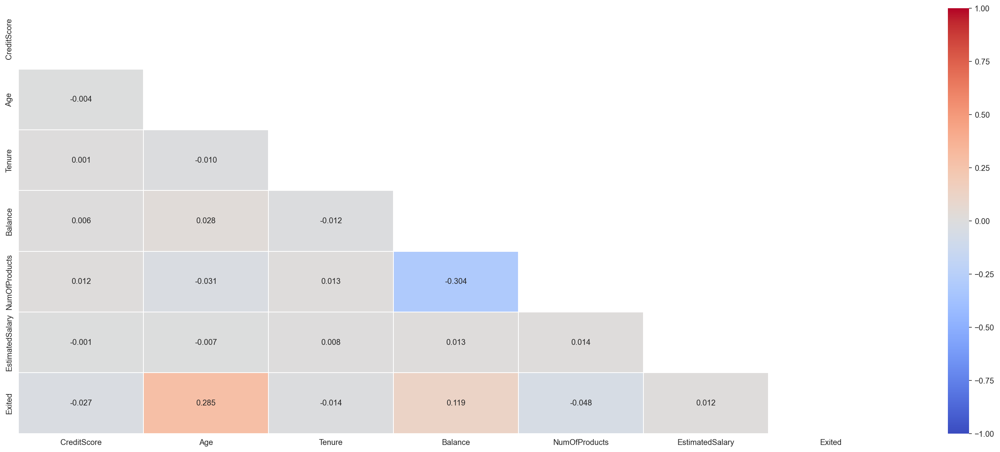

In [41]:
plt.figure(figsize=(25, 10))

corr_matrix = df[num_target].corr()

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

ax = sns.heatmap(corr_matrix, 
                 mask=mask, 
                 xticklabels=corr_matrix.columns, 
                 yticklabels=corr_matrix.columns, 
                 annot=True,
                 fmt='.3f',
                 linewidths=.2, 
                 cmap='coolwarm', 
                 vmin=-1, vmax=1);

We note the following:

    - Based on the matrix, we observe weak level correlation between the numerical features  and target feature
    - A few features has negative correlation with the target feature
        - 'CreditScore', 'Tenure', and 'NumOfProducts'

## 2.3 Categorical Features

Now its time to explore the data categorical features

In [42]:
# Get categorical features
cat = df.drop('Exited', axis=1).select_dtypes(include='object').columns

In [43]:
df[cat].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Geography       10000 non-null  object
 1   Gender          10000 non-null  object
 2   HasCrCard       10000 non-null  object
 3   IsActiveMember  10000 non-null  object
dtypes: object(4)
memory usage: 312.6+ KB


In [44]:
df[cat].shape

(10000, 4)

In [45]:
# Look at the categorical features
df[cat].head()

,Geography,Gender,HasCrCard,IsActiveMember
0,France,Female,1,1
1,Spain,Female,0,1
2,France,Female,1,0
3,France,Female,0,0
4,Spain,Female,1,1


### 2.3.1 Univariate Analysis

#### Statistical Summary

In [46]:
df[cat].describe().T.style.background_gradient(subset=['count', 'unique','freq'], cmap='RdPu')

,count,unique,top,freq
Geography,10000,3,France,5014
Gender,10000,2,Male,5457
HasCrCard,10000,2,1,7055
IsActiveMember,10000,2,1,5151


#### Unique Values

In [47]:
for feature in df[cat]:
    print(f'{feature} feature has {df[feature].nunique()} unique values.\n')
    print(f'{df[feature].unique()}\n')    

Geography feature has 3 unique values.

['France' 'Spain' 'Germany']

Gender feature has 2 unique values.

['Female' 'Male']

HasCrCard feature has 2 unique values.

[1 0]

IsActiveMember feature has 2 unique values.

[1 0]



#### Histogram Distribution

In [48]:
fig = df[cat].iplot(kind='hist', subplots=True,
                      title='<b>Histogram Distribution of Categorical Features<b>')
fig

We note the following:

**Geography**: 
    
    - Customers are from three countries: France, Germany and Spain.
    - Majority of customers are French (5014), then German (2509) and Spanish (2477).
   
**Gender**: 

    - There are more male customers (5457) then female customers (4543).
    
**HasCrCard**: 

    - Majority of customers have a credit card with the bank (7055) than not (2945).
                
**IsActiveMember**: 

    - Slightly more customers who are active (5151) than inactive members (4849).


### 2.3.2 Bivariate Analysis (vs. Target Feature)

#### GroupBy

In [49]:
df.groupby('Exited')[cat].describe().T

Exited                      0        1
Geography      count     7963     2037
               unique       3        3
               top     France  Germany
               freq      4204      814
Gender         count     7963     2037
               unique       2        2
               top       Male   Female
               freq      4559     1139
HasCrCard      count     7963     2037
               unique       2        2
               top          1        1
               freq      5631     1424
IsActiveMember count     7963     2037
               unique       2        2
               top          1        0
               freq      4416     1302

#### Histogram Distribution

In [50]:
for value, feature in enumerate(df[cat]):
    fig = px.histogram(df[feature], color=df['Exited'], barmode='group', 
                       title=f'<b>{feature} by Target Variable<b>')
    fig.show()

We note the following:

**Geography**: 
    
    German customers churn the most, followed by French and Spanish customers.
   
**Gender**: 

    Female customers are more likely to churn than male customers.
    
**HasCrCard**: 

    Customers with credit cards are more likely to churn than those without. Since a majority of customer 
    have a credit cards this is not a-typical.
                
**IsActiveMember**: 

    Customers who are not active memebers churn more than active memebers.


### 2.3.3 Relationships

#### Mutual Info Score

In [51]:
from sklearn.metrics import mutual_info_score

def cat_mut_inf(series):
    return mutual_info_score(series, df['Exited']) 

cat_mut_info = df[cat].apply(cat_mut_inf) 
cat_mut_info = cat_mut_info.sort_values(ascending=False).to_frame(name='Mutual Info Score') 
cat_mut_info

,Mutual Info Score
Geography,0.014017
IsActiveMember,0.012291
Gender,0.005652
HasCrCard,0.000025


We note the following:

We are through with EDA. Now time to move along to data preparation.

# 3. Data Preparation

Let's start with the raw data

In [52]:
df = raw_data.copy()
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


In [54]:
df.shape

(10000, 14)

## 3.1 Feature Engineering

We seek to add new features to the data that are likely to have an impact on the probability of churning. 

We'll add 3 new features to the data:

1. **BalanceSalaryRatio** 
         The ratio of customers bank 'Balance' vs. customers 'EstimatedSalary'.

2. **TenureByAge** 
        'Tenure' is a function of 'Age', we'll standardize 'Tenure' over 'Age'.
        
3. **CreditByAge** 
        'CreditScore' by 'Age' to  take into account credit behaviour by adult life.

In [55]:
df['BalanceSalaryRatio'] = df['Balance'] / df['EstimatedSalary']
df['TenureByAge'] = df['Tenure'] / df['Age']
df['CreditScoreGivenAge'] = df['CreditScore'] / df['Age']

In [56]:
df.shape

(10000, 17)

In [57]:
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,BalanceSalaryRatio,TenureByAge,CreditScoreGivenAge
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1,0.000000,0.047619,14.738095
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,0.744677,0.024390,14.829268
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,1.401375,0.190476,11.952381
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0,0.000000,0.025641,17.923077
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,1.587055,0.046512,19.767442


## 3.2 Split the data into train and test set

We'll separate the data into a train set and test set, getting 10% of the data for the test set.

In [58]:
train, test = train_test_split(df, test_size=.10, random_state=999)
print('The shape of the train set:', train.shape)
print('The shape of the test set:', test.shape)

The shape of the train set: (9000, 17)
The shape of the test set: (1000, 17)


    - The data was split into train and test set.
    - Train set contain 9000 rows and is what we'll use to train the model.
    - Test set contain 1000 rows and is what we'll use (i.e. new data) to test our already trained model.

In [59]:
# Save test set to csv
test.to_csv('../02-data/customer-churn-bank-test.csv', index=False)
print('CSV file saved!!')

CSV file saved!!


## 3.3 Parition the train data into features (X) and target (y)

In [60]:
X = train.drop(['RowNumber', 'CustomerId', 'Surname', 'Exited'], axis=1)
y = train['Exited']
print('The shape of X:', X.shape)
print('The shape of y:', y.shape)

The shape of X: (9000, 13)
The shape of y: (9000,)


## 3.4 Split into training and testing sets

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=999)
print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(7200, 13) (1800, 13)
(7200,) (1800,)


# 4. Modeling

## 4.1 Metric Selection

As we saw during EDA, the target feature **'Exited'** is imbalanced. 

For an imbalanced classification problem, there are a number of metrics to consider:

1. **Receiver Operating Characteristic Area Under the Curve (ROC AUC)**: 
        A measure between 0 and 1 comparing the performance of the classifier when predicting probabilities 
        across a range of thresholds.
2. **Precision Score**: 
        The number of true positives divided by the total number of positives predicted.
3. **Recall Score**: 
        The number of true positives divided by the total number of actual positives in the data.
4. **F1 Score**: 
        Harmonic mean of precision and recall.

The exact metric used and the threshold that our model needs to reach depends on the business need. We can tune the model to some extent to optimize for different metrics. 

We'll use:

1. **ROC AUC** metric to evaluate the model.
2. We'll also look at the **Precision** and **Recall** metrics on the test set.


## 4.2 Model Selection

We will try the following models:
    
1. **Linear Model**
    
        - Logistic Regression
        - Logistic Regression w/ Polynominal Features

2. **Ensemble Model**

        - Random Forest
    
3. **Boosting Model**

        - History Gradient Boosting

## 4.3 : LogReg Model

In [62]:
%%time

# Define numerical features data preprocessing
standard_scaler = StandardScaler()
num_preprocessor = Pipeline([('scale', standard_scaler)])

# Define categorical features data preprocessing
ohe = OneHotEncoder(handle_unknown='ignore')
cat_preprocessor = Pipeline([('encode', ohe)])

# Combine numerical and categorical preprocessing 
ct = ColumnTransformer([('numerical', num_preprocessor, selector(dtype_include='number')),
                        ('categorical', cat_preprocessor, selector(dtype_include='object'))])

# Instantiate model
logreg = LogisticRegression(solver='liblinear', random_state=999)

# Define model pipeline
logreg_model = Pipeline([('preprocessing', ct), ('model', logreg)])

# Define model evaluation strategy
skfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=999)
metric = 'roc_auc'

# Evaluate model 
logreg_cvscore = round((cross_val_score(logreg_model, X_train, y_train, scoring=metric, cv=skfold, n_jobs=-1, 
                                 error_score='raise', verbose=0) * 100).mean(), 4)

# Display model score
print(f'The mean CV ROC-AUC score: {logreg_cvscore}%')

The mean CV ROC-AUC score: 76.7057%
CPU times: user 72.3 ms, sys: 91.8 ms, total: 164 ms
Wall time: 2.01 s


Get model test score for ROC-AUC, Precision and Recall

In [63]:
# Fit model pipeline
logreg_model.fit(X_train, y_train)
    
# Predict model pipeline
logreg_pred = logreg_model.predict(X_test)
logreg_predprob = logreg_model.predict_proba(X_test)[:,1]

logreg_roc_auc = round(roc_auc_score(y_test, logreg_predprob) * 100, 4)
logreg_precision = round(precision_score(y_test, logreg_pred) * 100, 4)
logreg_recall = round(recall_score(y_test, logreg_pred) * 100, 4)

# Display model text score
print(f'The ROC-AUC test score: {logreg_roc_auc}%')
print(f'The Precision test score: {logreg_precision}%')
print(f'The Recall test score: {logreg_recall}%')

The ROC-AUC test score: 78.4133%
The Precision test score: 73.7705%
The Recall test score: 24.3902%


In [64]:
logreg_model_result = pd.DataFrame(logreg_cvscore, columns=['CV ROC-AUC'], index=['LogReg'])
logreg_model_result['ROC-AUC'] = logreg_roc_auc
logreg_model_result['Precision'] = logreg_precision
logreg_model_result['Recall'] = logreg_recall
logreg_model_result

,CV ROC-AUC,ROC-AUC,Precision,Recall
LogReg,76.7057,78.4133,73.7705,24.3902


## 4.4 : LogReg-Poly Model

In [65]:
%%time

# Define numerical features data preprocessing
standard_scaler = StandardScaler()
num_preprocessor = Pipeline([('scale', standard_scaler)])

# Define categorical features data preprocessing
ohe = OneHotEncoder(handle_unknown='ignore')
cat_preprocessor = Pipeline([('encode', ohe)])

# Combine numerical and categorical preprocessing 
ct = ColumnTransformer([('numerical', num_preprocessor, selector(dtype_include='number')),
                        ('categorical', cat_preprocessor, selector(dtype_include='object'))])

# Instantiate model
logreg = LogisticRegression(solver='liblinear', random_state=999)

# Define model pipeline
logreg_poly_model = Pipeline([('preprocessing', ct), 
                              ('feature_engineering', PolynomialFeatures(degree=2)),
                              ('model', logreg)])

# Define model evaluation strategy
skfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=999)
metric = 'roc_auc'

# Evaluate model 
logreg_poly_cvscore = round((cross_val_score(logreg_poly_model, X_train, y_train, scoring=metric, cv=skfold, 
                                             n_jobs=-1, error_score='raise', verbose=0) * 100).mean(), 4)

# Display model score
print(f'The mean CV ROC-AUC score: {logreg_poly_cvscore}%')

The mean CV ROC-AUC score: 85.0504%
CPU times: user 168 ms, sys: 28.8 ms, total: 197 ms
Wall time: 2.09 s


Get model test score for ROC-AUC, Precision and Recall

In [66]:
# Fit model pipeline
logreg_poly_model.fit(X_train, y_train)
    
# Predict model pipeline
logreg_poly_pred = logreg_poly_model.predict(X_test)
logreg_poly_predprob = logreg_poly_model.predict_proba(X_test)[:,1]

logreg_poly_roc_auc = round(roc_auc_score(y_test, logreg_poly_predprob) * 100, 4)
logreg_poly_precision = round(precision_score(y_test, logreg_poly_pred) * 100, 4)
logreg_poly_recall = round(recall_score(y_test, logreg_poly_pred) * 100, 4)

# Display model text score
print(f'The ROC-AUC test score: {logreg_poly_roc_auc}%')
print(f'The Precision test score: {logreg_poly_precision}%')
print(f'The Recall test score: {logreg_poly_recall}%')

The ROC-AUC test score: 87.9713%
The Precision test score: 79.918%
The Recall test score: 52.8455%


In [67]:
logreg_poly_model_result = pd.DataFrame(logreg_poly_cvscore, columns=['CV ROC-AUC'], index=['LogReg-Poly'])
logreg_poly_model_result['ROC-AUC'] = logreg_poly_roc_auc
logreg_poly_model_result['Precision'] = logreg_poly_precision
logreg_poly_model_result['Recall'] = logreg_poly_recall
logreg_poly_model_result

,CV ROC-AUC,ROC-AUC,Precision,Recall
LogReg-Poly,85.0504,87.9713,79.918,52.8455


Whoa! Adding Polynominal Feature to the pipeline dramatically improved the LogReg model. 
    
    - The CV ROC-AUC score is 85.0504%, up from 76.7057%.

## 4.5 : RF Model

Let's try our first tree-based model - Random Forest.

In [68]:
%%time

# Define numerical features data preprocessing
#standard_scaler = StandardScaler()
#num_preprocessor = Pipeline([('scale', standard_scaler)])


# Define categorical features data preprocessing
oe = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
cat_preprocessor = Pipeline([('ordinal_encode', oe)])

# Combine numerical and categorical preprocessing 
ct = ColumnTransformer([('categorical', cat_preprocessor, selector(dtype_include='object'))],
                       remainder='passthrough')

# Instantiate model
rf = RandomForestClassifier(random_state=999)

# Define model pipeline
rf_model = Pipeline([('preprocessing', ct),('model', rf)])

# Define model evaluation strategy
skfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=999)
metric = 'roc_auc'

# Evaluate model 
rf_cvscore = round((cross_val_score(rf_model, X_train, y_train, scoring=metric, cv=skfold, n_jobs=-1, 
                             error_score='raise', verbose=0) * 100).mean(), 4)

# Display model score
print(f'The mean CV ROC-AUC score: {rf_cvscore}%')

The mean CV ROC-AUC score: 84.2341%
CPU times: user 197 ms, sys: 38.1 ms, total: 235 ms
Wall time: 2.96 s


In [69]:
# Fit model pipeline
rf_model.fit(X_train, y_train)
    
# Predict model pipeline
rf_pred = rf_model.predict(X_test)
rf_predprob = rf_model.predict_proba(X_test)[:,1]

rf_roc_auc = round(roc_auc_score(y_test, rf_predprob) * 100, 4)
rf_precision = round(precision_score(y_test, rf_pred) * 100, 4)
rf_recall = round(recall_score(y_test, rf_pred) * 100, 4)

# Display model text score
print(f'The ROC-AUC test score: {rf_roc_auc}%')
print(f'The Precision test score: {rf_precision}%')
print(f'The Recall test score: {rf_recall}%')

The ROC-AUC test score: 85.9377%
The Precision test score: 78.733%
The Recall test score: 47.1545%


In [70]:
rf_model_result = pd.DataFrame(rf_cvscore, columns=['CV ROC-AUC'], index=['Random Forest'])
rf_model_result['ROC-AUC'] = rf_roc_auc
rf_model_result['Precision'] = rf_precision
rf_model_result['Recall'] = rf_recall
rf_model_result

,CV ROC-AUC,ROC-AUC,Precision,Recall
Random Forest,84.2341,85.9377,78.733,47.1545


## 4.6 : HGB Model

Time for the second tree-based model - History Gradient Boosting.

In [71]:
%%time

# Define numerical features data preprocessing
#standard_scaler = StandardScaler()
#num_preprocessor = Pipeline([('scale', standard_scaler)])


# Define categorical features data preprocessing
oe = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
cat_preprocessor = Pipeline([('ordinal_encode', oe)])

# Combine numerical and categorical preprocessing 
ct = ColumnTransformer([('categorical', cat_preprocessor, selector(dtype_include='object'))],
                       remainder='passthrough')

# Instantiate model
hgb = HistGradientBoostingClassifier(random_state=999)

# Define model pipeline
hgb_model = Pipeline([('preprocessing', ct),('model', hgb)])

# Define model evaluation strategy
skfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=999)
metric = 'roc_auc'

# Evaluate model 
hgb_cvscore = round((cross_val_score(hgb_model, X_train, y_train, scoring=metric, cv=skfold, n_jobs=-1, 
                             error_score='raise', verbose=0) * 100).mean(), 4)

# Display model score
print(f'The mean CV ROC-AUC score: {hgb_cvscore}%')

The mean CV ROC-AUC score: 84.864%
CPU times: user 32.4 ms, sys: 5.97 ms, total: 38.4 ms
Wall time: 1.17 s


In [72]:
# Fit model pipeline
hgb_model.fit(X_train, y_train)
    
# Predict model pipeline
hgb_pred = hgb_model.predict(X_test)
hgb_predprob = hgb_model.predict_proba(X_test)[:,1]

hgb_roc_auc = round(roc_auc_score(y_test, hgb_predprob) * 100, 4)
hgb_precision = round(precision_score(y_test, hgb_pred) * 100, 4)
hgb_recall = round(recall_score(y_test, hgb_pred) * 100, 4)

# Display model text score
print(f'The ROC-AUC test score: {hgb_roc_auc}%')
print(f'The Precision test score: {hgb_precision}%')
print(f'The Recall test score: {hgb_recall}%')

The ROC-AUC test score: 87.7359%
The Precision test score: 78.629%
The Recall test score: 52.8455%


In [73]:
hgb_model_result = pd.DataFrame(hgb_cvscore, columns=['CV ROC-AUC'], index=['History Gradient Boosting'])
hgb_model_result['ROC-AUC'] = hgb_roc_auc
hgb_model_result['Precision'] = hgb_precision
hgb_model_result['Recall'] = hgb_recall
hgb_model_result

,CV ROC-AUC,ROC-AUC,Precision,Recall
History Gradient Boosting,84.864,87.7359,78.629,52.8455


## 4.7 Model Comparison

Let's have a look at all the models and compare them.

In [74]:
# Concat each model score into a dataframe
model_result = pd.concat([logreg_model_result, logreg_poly_model_result, rf_model_result, hgb_model_result], axis=0)

# Sort the dataframe by best score
model_result.sort_values(by=['CV ROC-AUC'], ascending=False, inplace=True)

# Display the dataframe
model_result

,CV ROC-AUC,ROC-AUC,Precision,Recall
LogReg-Poly,85.0504,87.9713,79.9180,52.8455
History Gradient Boosting,84.8640,87.7359,78.6290,52.8455
Random Forest,84.2341,85.9377,78.7330,47.1545
LogReg,76.7057,78.4133,73.7705,24.3902


    Based on the mean CV ROC-AUC score:
        - LogReg-Poly model performs the best with a score of 85.0504%.

Let's visualize the model results

In [75]:
# Plot model results
model_result['CV ROC-AUC'].iplot(kind='bar',
                                 title='<b>Model CV ROC-AUC Score<b>')

### 4.7.1 Models Statistical Difference

Let's check the statistical difference between model scores

In [76]:
%%time

# LogReg model
logreg_results = cross_val_score(logreg_model, X_train, y_train, scoring=metric, cv=skfold, 
                                 n_jobs=-1, error_score='raise', verbose=0) * 100
                              
print(f'Best LogReg model mean CV ROC-AUC score: {logreg_results.mean():.4f}%')


# LogReg with Poly model
logreg_poly_results = cross_val_score(logreg_poly_model, X_train, y_train, scoring=metric, cv=skfold, 
                                      n_jobs=-1, error_score='raise', verbose=0) * 100
                              
print(f'Best LogReg-Poly model mean CV ROC-AUC score: {logreg_poly_results.mean():.4f}%')


# Random Forest model
rf_results = cross_val_score(rf_model, X_train, y_train, scoring=metric, cv=skfold, 
                             n_jobs=-1, error_score='raise', verbose=0) * 100
                              
print(f'Best RF model mean CV ROC-AUC score: {rf_results.mean():.4f}%')


# History Gradient Boosting model
hgb_results = cross_val_score(hgb_model, X_train, y_train, scoring=metric, cv=skfold, 
                              n_jobs=-1, error_score='raise', verbose=0) * 100
                              
print(f'Best HGB model mean CV ROC-AUC score: {hgb_results.mean():.4f}%')

Best LogReg model mean CV ROC-AUC score: 76.7057%
Best LogReg-Poly model mean CV ROC-AUC score: 85.0504%
Best RF model mean CV ROC-AUC score: 84.2341%
Best HGB model mean CV ROC-AUC score: 84.8640%
CPU times: user 269 ms, sys: 40.8 ms, total: 309 ms
Wall time: 6.45 s


A p-value smaller than 0.05 indicates a statistically significant difference.

###### LogReg vs. LogReg-Poly, RF, HGB

In [77]:
print(stats.ttest_rel(logreg_results, logreg_poly_results))
print(stats.ttest_rel(logreg_results, rf_results))
print(stats.ttest_rel(logreg_results, hgb_results))

Ttest_relResult(statistic=-16.176052602039128, pvalue=5.8468579649658654e-08)
Ttest_relResult(statistic=-13.919403971399776, pvalue=2.1557082383058744e-07)
Ttest_relResult(statistic=-19.251800744630536, pvalue=1.2705581691574593e-08)


###### LogReg-Poly vs. RF, HGB

In [78]:
print(stats.ttest_rel(logreg_poly_results, rf_results))
print(stats.ttest_rel(logreg_poly_results, hgb_results))

Ttest_relResult(statistic=1.972369138046307, pvalue=0.08003649964763293)
Ttest_relResult(statistic=0.6334996842322095, pvalue=0.5421692010279202)


###### RF vs. HGB

In [79]:
print(stats.ttest_rel(rf_results, hgb_results))

Ttest_relResult(statistic=-2.117304007820305, pvalue=0.06331426914118508)


Looking at these results, we observe:

- All models are statistical siginificant compared to LogReg model.
    
        - The difference compared between LogReg model and all other models are indeed statistically significant, 
          the p-value is smaller than 0.05, thus we can conclude that at a 95% sigificance level, all models 
          are statistically better models (in terms of ROC-AUC) when compared on the test set.

- There is no statistical significance between LogReg-Poly, RandomForest and HistoryGradientBoosting models.
   
       - The difference compared between LogReg-Poly, RF, HGB models is not statistically significant, 
         the p-values is not smaller than 0.05. The models performed similiarly.

## 4.8 Tune Best Model - LogReg w/ Poly

Above we saw that there was no statistically significance between RF, HGB and LogReg-Poly models and that they performed similiarly. However, the LogReg-Poly model slightly outperformed the other two models with a 85.0504% CV ROC-AUC score, so we'll tune it as the best model found.

In [80]:
%%time

# Define numerical features data preprocessing
standard_scaler = StandardScaler()
num_preprocessor = Pipeline([('scale', standard_scaler)])

# Define categorical features data preprocessing
ohe = OneHotEncoder(handle_unknown='ignore')
cat_preprocessor = Pipeline([('encode', ohe)])

# Combine numerical and categorical preprocessing 
ct = ColumnTransformer([('numerical', num_preprocessor, selector(dtype_include='number')),
                        ('categorical', cat_preprocessor, selector(dtype_include='object'))])

# Instantiate model
logreg = LogisticRegression(solver='liblinear', random_state=999)

# Define model pipeline
logreg_poly_model = Pipeline([('preprocessing', ct), 
                              ('feature_engineering', PolynomialFeatures(degree=2)),
                              ('model', logreg)])

CPU times: user 215 µs, sys: 16 µs, total: 231 µs
Wall time: 236 µs


In [81]:
# Get list of model pipeline parameters
logreg_poly_model.get_params()

{'memory': None,
 'steps': [('preprocessing',
   ColumnTransformer(transformers=[('numerical',
                                    Pipeline(steps=[('scale', StandardScaler())]),
                                    <sklearn.compose._column_transformer.make_column_selector object at 0x15d021e50>),
                                   ('categorical',
                                    Pipeline(steps=[('encode',
                                                     OneHotEncoder(handle_unknown='ignore'))]),
                                    <sklearn.compose._column_transformer.make_column_selector object at 0x15cf5c070>)])),
  ('feature_engineering', PolynomialFeatures()),
  ('model', LogisticRegression(random_state=999, solver='liblinear'))],
 'verbose': False,
 'preprocessing': ColumnTransformer(transformers=[('numerical',
                                  Pipeline(steps=[('scale', StandardScaler())]),
                                  <sklearn.compose._column_transformer.make_column_sel

In [82]:
%%time

# Define parameter grid
logreg_poly_param_grid = {
    'model__C': [0.1, 0.5, 1, 10, 50, 100],
    'model__max_iter': range(250, 1000),
    'model__penalty': ['l1', 'l2'],
    'model__tol': [0.00001, 0.0001, 0.000001]
}

# Tune model 
logreg_poly_rs = RandomizedSearchCV(logreg_poly_model, param_distributions=logreg_poly_param_grid, n_iter=10, 
                                    scoring=metric, n_jobs=-1, cv=skfold, verbose=1, random_state=999,
                                    error_score='raise', return_train_score=True)

logreg_poly_rs.fit(X_train, y_train);

Fitting 10 folds for each of 10 candidates, totalling 100 fits
CPU times: user 11.8 s, sys: 127 ms, total: 11.9 s
Wall time: 3min 27s


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=999, shuffle=True),
                   error_score='raise',
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(transformers=[('numerical',
                                                                               Pipeline(steps=[('scale',
                                                                                                StandardScaler())]),
                                                                               <sklearn.compose._column_transformer.make_column_selector object at 0x15d021e50>),
                                                                              ('categorical',
                                                                               Pipeline(steps=[('enco...
                                                                               <sklearn.compose._column_transformer.make_column_selector object at 0x15cf5c070>)])),
                                             ('feature_engineering',
                                              PolynomialFeatures()),
                                             ('model',
                                              LogisticRegression(random_state=999,
                                                                 solver='liblinear'))]),
                   n_jobs=-1,
                   param_distributions={'model__C': [0.1, 0.5, 1, 10, 50, 100],
                                        'model__max_iter': range(250, 1000),
                                        'model__penalty': ['l1', 'l2'],
                                        'model__tol': [1e-05, 0.0001, 1e-06]},
                   random_state=999, return_train_score=True, scoring='roc_auc',
                   verbose=1)

### Evaluate Model

In [83]:
best_model_score = logreg_poly_rs.best_score_
best_model_params = logreg_poly_rs.best_params_
best_model = logreg_poly_rs.best_estimator_

print(f'Best model CV ROC-AUC score: {(best_model_score * 100):.3f}%')
print(f'Best model parameters: {best_model_params}')
print('Best model saved!')

Best model CV ROC-AUC score: 85.103%
Best model parameters: {'model__tol': 1e-05, 'model__penalty': 'l1', 'model__max_iter': 472, 'model__C': 0.5}
Best model saved!


    - The CV ROC-AUC for LogReg-Poly slight increased from 85.0504% to 85.103%

Let's take a look at the model results. We'll look at the top 5 results.

In [84]:
print('Model results:\n')
best_model_results = pd.DataFrame(logreg_poly_rs.cv_results_).sort_values(by='rank_test_score', ascending=True)
best_model_results.head()

Model results:



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__tol,param_model__penalty,param_model__max_iter,param_model__C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
3,23.742178,4.222982,0.017304,0.003165,0.00001,l1,472,0.5,"{'model__tol': 1e-05, 'model__penalty': 'l1', ...",0.846767,0.878940,0.860728,0.845532,0.827833,0.836385,0.847784,0.861640,0.853785,0.850914,0.851031,0.013434,1,0.864718,0.861660,0.863586,0.864891,0.867736,0.866286,0.865697,0.864095,0.864188,0.864829,0.864769,0.001544
0,41.387929,7.367954,0.015446,0.002444,0.00001,l1,856,1,"{'model__tol': 1e-05, 'model__penalty': 'l1', ...",0.844677,0.878394,0.860906,0.846007,0.827844,0.837153,0.847146,0.860211,0.855946,0.848859,0.850714,0.013302,2,0.865649,0.862454,0.864413,0.865615,0.868475,0.867071,0.866685,0.865024,0.864914,0.865556,0.865586,0.001540
2,2.206727,0.095339,0.015225,0.001395,0.000001,l2,810,10,"{'model__tol': 1e-06, 'model__penalty': 'l2', ...",0.844214,0.876506,0.862450,0.852726,0.825777,0.838889,0.845292,0.858167,0.856254,0.846461,0.850674,0.013209,3,0.866524,0.863565,0.865337,0.866378,0.869402,0.868008,0.867909,0.865905,0.866028,0.866531,0.866559,0.001523
9,42.903256,7.826859,0.011889,0.004626,0.00001,l1,648,10,"{'model__tol': 1e-05, 'model__penalty': 'l1', ...",0.844202,0.876554,0.862568,0.852833,0.825966,0.838866,0.845374,0.857919,0.855616,0.846213,0.850611,0.013163,4,0.866554,0.863552,0.865331,0.866379,0.869411,0.868015,0.867946,0.865930,0.866035,0.866528,0.866568,0.001531
1,1.456134,0.120227,0.014482,0.000913,0.000001,l2,942,1,"{'model__tol': 1e-06, 'model__penalty': 'l2', ...",0.844535,0.878038,0.860681,0.847135,0.826179,0.838535,0.846307,0.859313,0.856821,0.847323,0.850487,0.013375,5,0.866054,0.862999,0.864848,0.866000,0.868983,0.867466,0.867297,0.865513,0.865477,0.866029,0.866067,0.001534


# 5. Model Predictions on Hold-Out Test Set

In [85]:
best_model.fit(X_train, y_train)
best_model_pred = best_model.predict(X_test)
best_model_predprob = best_model.predict_proba(X_test)[:, 1]

### ROC-AUC

In [86]:
roc_auc = roc_auc_score(y_test, best_model_predprob) * 100
print(f'Best model ROC-AUC test score: {roc_auc:.3f}%')

Best model ROC-AUC test score: 88.208%


### Classification Report

In [87]:
cr = classification_report(y_test, best_model_pred)
print(f'Best Model Classification Report\n\n{cr}')

Best Model Classification Report

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      1431
           1       0.80      0.53      0.64       369

    accuracy                           0.88      1800
   macro avg       0.84      0.75      0.78      1800
weighted avg       0.87      0.88      0.87      1800



### Precision

In [88]:
precision = precision_score(y_test, best_model_pred) * 100
print(f'Best Model Precision test score: {precision:.3f}%')

Best Model Precision test score: 80.165%


### Recall

In [89]:
recall = recall_score(y_test, best_model_pred) * 100
print(f'Best Model Recall test score: {recall:.3f}%')

Best Model Recall test score: 52.575%


### Confusion Matrix

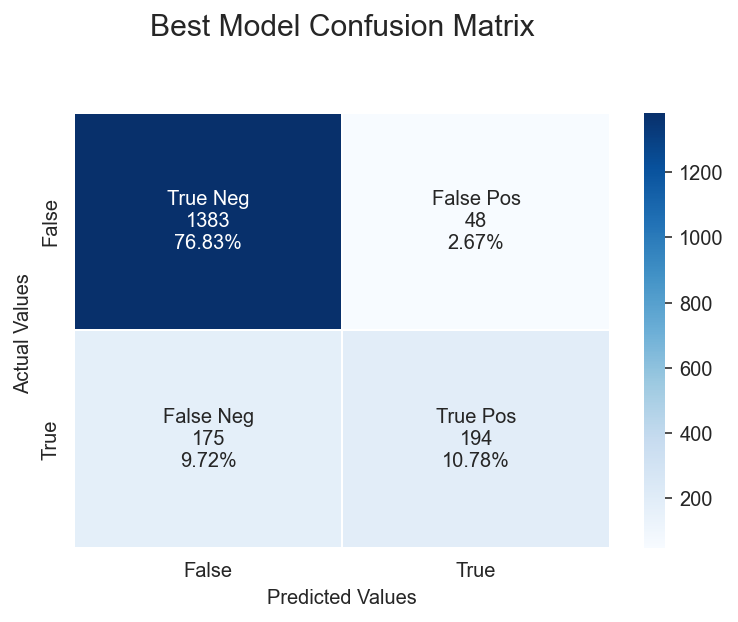

In [90]:
cm = confusion_matrix(y_test, best_model_pred)

group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']

group_sum = ['{0:0.0F}'.format(value) for value in cm.flatten()]

group_percent = ['{0:.2%}'.format(value) for value in 
                 cm.flatten()/np.sum(cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
         zip(group_names, group_sum, group_percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(cm, annot=labels, fmt='', linewidths=0.75, cmap='Blues')

ax.set_title('Best Model Confusion Matrix\n\n', size=15);
ax. set_xlabel("Predicted Values")
ax. set_ylabel('Actual Values ');
#
# Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False', 'True'])
ax.yaxis.set_ticklabels(['False', 'True']);

### Summary of Best Model Results

In [91]:
best_model_result = pd.DataFrame(columns=['CV ROC-AUC', 'ROC-AUC', 'Precision', 'Recall'], 
                                 index=['Tuned LogReg-Poly'])

best_model_result.loc['Tuned LogReg-Poly', 'CV ROC-AUC'] = round(best_model_score * 100, 3)
best_model_result.loc['Tuned LogReg-Poly', 'ROC-AUC'] = round(roc_auc, 3)
best_model_result.loc['Tuned LogReg-Poly', 'Precision'] = round(precision, 3)
best_model_result.loc['Tuned LogReg-Poly', 'Recall'] = round(recall, 3)
best_model_result

,CV ROC-AUC,ROC-AUC,Precision,Recall
Tuned LogReg-Poly,85.103,88.208,80.165,52.575


    - The best model (tuned LogReg w/ Poly) achieved:
    
        - Mean CV ROC-AUC score of 85.103%
        - ROC-AUC test score of 88.208%
        - Precision test score of 80.165% 
        - Recall test score of 52.575% 

# 6. Conclusions

We have developed a resuable model pipeline, the optimized model is able to solve the business problem of predicting customer churn with given parameters. The model can be deployed - used to make predictions on new data.

Our Approach:

- We started out with a detailed exploratory data analysis of the data, analyzing the descriptive and target features.
- Next, we cleaned and prepared the data for machine learning.
    - Encoded the categorical features
    - We carried our feature engineering, creating three new features for the data
    - Split the data into training and testing sets
- We decided on models to use, our model evaluation strategy and metric selection
    - We settled on **ROC-AUC** metric since the target feature is imbalanced
    - We tried 4 different classifers
            - LogReg
            - LogReg with Polynominal Features
            - Random Forest
            - History Gradient Boosting
- We compare and evaluate models results choosing best model (**LogReg-Poly**) and tuned hyperparameters.
- We inspect best model (**Tuned LogReg-Poly**) predicitons on hold-out test set.

In [92]:
model_result = pd.concat([model_result, best_model_result], axis=0)
model_result.sort_values(by=['CV ROC-AUC'], ascending=False, inplace=True)
model_result

,CV ROC-AUC,ROC-AUC,Precision,Recall
Tuned LogReg-Poly,85.103,88.208,80.165,52.575
LogReg-Poly,85.0504,87.9713,79.918,52.8455
History Gradient Boosting,84.864,87.7359,78.629,52.8455
Random Forest,84.2341,85.9377,78.733,47.1545
LogReg,76.7057,78.4133,73.7705,24.3902


In [93]:
model_result['CV ROC-AUC'].iplot(kind='bar',
                                 title='<b>Model Comparison by CV ROC-AUC<b>')

The aim is to predict the customers that will possibly churn so they can be put in some sort of scheme to prevent churn hence the recall measures on the 1's is of most important, more so than the overall CV ROC-AUC score of the model.

Earlier during EDA, we noted that we had about 20% of churn, a recall greater than this baseline will already be an improvement, but we want to get as high as possible while also trying to maintain a high precision so that the bank can train its resources effectively towards clients highlighted by the model without wasting too much resources on the false positives.

From the review of the fitted models above, the best model that gives a decent balance of the recall and precision is the **Tuned LogReg** model where according to the fit on the training set, with a **precision score** on 1's of **0.80**, out of all customers that the model thinks will churn, **80.17%** do actually churn and with the **recall score** of **0.52** on the 1's, the model is able to highlight **52.58%** of all those who churned.

The threshold that our model needs to reach depends on the business need. We can tune the model threshold to some extent to optimize for different metrics.

## 6.1 Save Best Model

In [94]:
# Fit best model on all the data
best_model.fit(X, y);

In [95]:
import joblib
joblib.dump(best_model, '../03-model/customer-churn-bank-logregpoly-model-v1.pkl', compress=1)
print('Best Model Saved!!')

Best Model Saved!!


# 7. Model Testing

Let's test the best model on new unseen data (i.e. the test set we split off at the beginning). 

*Note, this test set is raw data (unpreprocessed) that the model has not seen yet. This is not the same as the testing set that was used to train the model.*

## 7.1 Load Model

First we need to load in the model.

In [96]:
model = joblib.load('../03-model/customer-churn-bank-logregpoly-model-v1.pkl')
model

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('scale',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x15cc39e50>),
                                                 ('categorical',
                                                  Pipeline(steps=[('encode',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x15cc39e80>)])),
                ('feature_engineering', PolynomialFeatures()),
                ('model',
                 LogisticRegression(C=0.5, max_iter=472, penalty='l1',
                                    random_state=999, solver='liblinear',
                                    tol=1e-05))])

## 7.2 Import New Data

In [97]:
# Import new data
test_set = pd.read_csv('../02-data/customer-churn-bank-test.csv')

In [98]:
# Let's look at the new data
test_set.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,BalanceSalaryRatio,TenureByAge,CreditScoreGivenAge
0,9032,15742323,Barese,541,France,Male,39,7,0.00,2,1,0,19823.02,0,0.000000,0.179487,13.871795
1,3463,15713596,Ugochukwu,428,France,Female,62,1,107735.93,1,0,1,58381.77,0,1.845369,0.016129,6.903226
2,3864,15645095,Huang,674,France,Female,28,3,0.00,1,1,0,51536.99,0,0.000000,0.107143,24.071429
3,1145,15694821,Hardy,765,Germany,Male,43,4,148962.76,1,0,1,173878.87,1,0.856704,0.093023,17.790698
4,2693,15736274,Prokhorova,751,France,Male,31,8,0.00,2,0,0,17550.49,0,0.000000,0.258065,24.225806


In [99]:
X_new = test_set.drop(['RowNumber', 'CustomerId', 'Surname', 'Exited'], axis=1)
y_true = test_set['Exited']
print('The shape of X_new:', X_new.shape)
print('The shape of y_true:', y_true.shape)

The shape of X_new: (1000, 13)
The shape of y_true: (1000,)


## 7.3 Make Predictions

In [100]:
model_pred = model.predict(X_new)

In [101]:
predictions = pd.DataFrame({'ModelPrediction': model_pred, 'ActualResult': y_true})
predictions.head()

,ModelPrediction,ActualResult
0,0,0
1,0,0
2,0,0
3,0,1
4,0,0


In [102]:
# Save test set predictions to a csv
predictions.to_csv('../02-data/customer-churn-bank-test-predictions.csv')
print('CSV file saved!!')

CSV file saved!!


### Evaluate Predictions

Let's compare the predictions from the model to the actual result.

In [103]:
comparison = model_pred == y_true
np.unique(comparison, return_counts=True)

(array([False,  True]), array([130, 870]))

    - Out of 1000, the model correctly predicted 870 (87%) predictions, while 130 (13%) predictions the 
      model incorrectly predicted. 

### Confusion Matrix

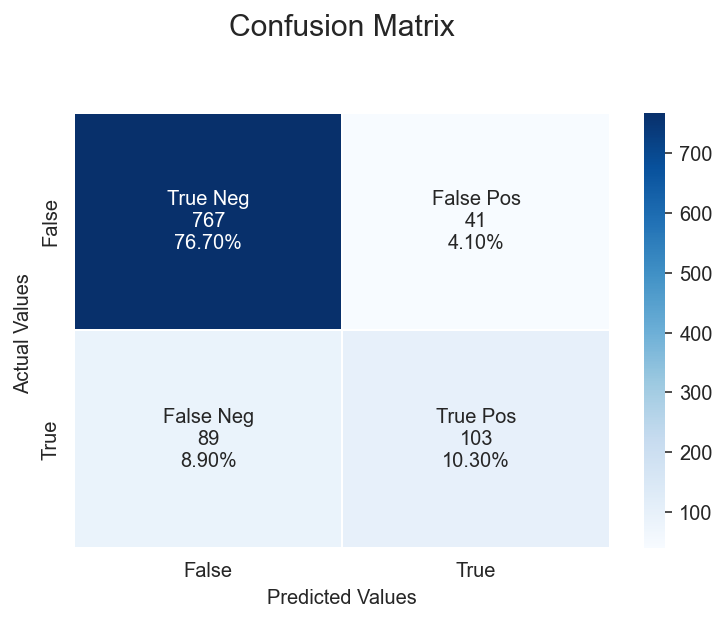

In [104]:
cm = confusion_matrix(y_true, model_pred)

group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']

group_sum = ['{0:0.0F}'.format(value) for value in cm.flatten()]

group_percent = ['{0:.2%}'.format(value) for value in 
                 cm.flatten()/np.sum(cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
         zip(group_names, group_sum, group_percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(cm, annot=labels, fmt='', linewidths=0.75, cmap='Blues')

ax.set_title('Confusion Matrix\n\n', size=15);
ax. set_xlabel("Predicted Values")
ax. set_ylabel('Actual Values ');

# Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False', 'True'])
ax.yaxis.set_ticklabels(['False', 'True']);

### Classification Report

In [105]:
cr = classification_report(y_true, model_pred)
print(f'Classification Report\n\n{cr}')

Classification Report

              precision    recall  f1-score   support

           0       0.90      0.95      0.92       808
           1       0.72      0.54      0.61       192

    accuracy                           0.87      1000
   macro avg       0.81      0.74      0.77      1000
weighted avg       0.86      0.87      0.86      1000



# 9. Reproducibility

In [106]:
%watermark -a 'Rainier Goubault' -n -m -v -iv 

Author: Rainier Goubault

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.29.0

Compiler    : Clang 11.1.0 
OS          : Darwin
Release     : 21.1.0
Machine     : x86_64
Processor   : i386
CPU cores   : 8
Architecture: 64bit

seaborn   : 0.11.2
cufflinks : 0.17.3
joblib    : 1.1.0
pandas    : 1.3.4
json      : 2.0.9
scipy     : 1.7.3
numpy     : 1.21.4
plotly    : 5.4.0
matplotlib: 3.5.0
sklearn   : 1.0.1

